Install additional packages

In [1]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-wl48tsea
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-wl48tsea
  Resolved https://github.com/tensorflow/docs to commit cc23491973e235ec68b93588a00ae9f4fe3d62a1
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=184468 sha256=faf3b29d02c79e5021956bdee386ddf6a5db2faa8aa7b06de0741a3c6e4395e4
  Stored in directory: /tmp/pip-ephem-wheel-cache-08juvad4/wheels/3b/ee/a2/ab4d36a9a4af495bcb936f3e849d4b497b65fa40548a68d6c3
Successfully built tensorflow-docs
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Imports

In [2]:
import glob
import matplotlib.pyplot as plt
import imageio
import numpy as np
import os
import PIL
import time
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers

from IPython import display


Parameters

In [3]:
plt.rcParams["figure.figsize"] = (5,5)

Random mask

# Dataset

load dataset

In [4]:
(y_train, _), (y_test,_) = tf.keras.datasets.cifar10.load_data()
y_train = tf.convert_to_tensor(y_train, dtype=tf.float32)
y_test = tf.convert_to_tensor(y_test, dtype=tf.float32)
y_train = (y_train - 127.5 ) / 127.5  # Normalize the images to [-1, 1]
y_test = (y_test - 127.5 ) / 127.5  # Normalize the images to [-1, 1]

170498071/170498071 [==============================] - 2s 0us/step


cutout 

In [5]:
# cutout 
x_train = tf.identity(y_train)
x_test = tf.identity(y_test)

# random cutout
# x_train = tfa.image.random_cutout(y_train, mask_size=(16,16), constant_values=1.0)
# x_test = tfa.image.random_cutout(y_test, mask_size=(16,16),constant_values=1.0)

In [6]:
def random_cutout(image_batch, mask_size=(16,16), border=(2,2)):
  x = tf.shape(image_batch)[1]
  y = tf.shape(image_batch)[2]

  xoffset = tf.cast(tf.math.ceil(mask_size[0] / 2.) + border[0], dtype=tf.int32)
  yoffset = tf.cast(tf.math.ceil(mask_size[1] / 2.) + border[1], dtype=tf.int32)
  xmin, xmax = xoffset, x - xoffset
  ymin, ymax = yoffset, y - yoffset

  xoffset = tf.random.uniform(shape=[], minval=xmin, maxval=xmax, dtype=tf.dtypes.int32)
  yoffset = tf.random.uniform(shape=[], minval=ymin, maxval=ymax, dtype=tf.dtypes.int32)

  xmin, xmax = xoffset - tf.cast(tf.math.ceil(mask_size[0] / 2.), dtype=tf.int32), xoffset + tf.cast(tf.math.ceil(mask_size[0] / 2.), dtype=tf.int32)
  ymin, ymax = yoffset - tf.cast(tf.math.ceil(mask_size[1] / 2.), dtype=tf.int32), yoffset + tf.cast(tf.math.ceil(mask_size[1] / 2.), dtype=tf.int32)

  mask = tfa.image.cutout(tf.zeros_like(image_batch), mask_size=mask_size, offset=(yoffset,xoffset), constant_values=1.)
  context = image_batch * (1 - mask)
  random_region = image_batch * mask
  return context, random_region, mask

tf.Tensor([25 32 32  3], shape=(4,), dtype=int32)


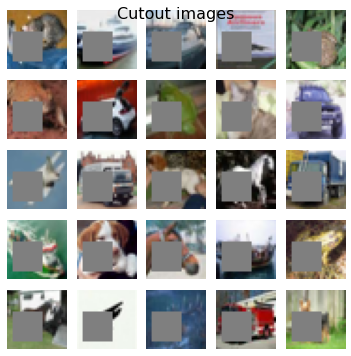

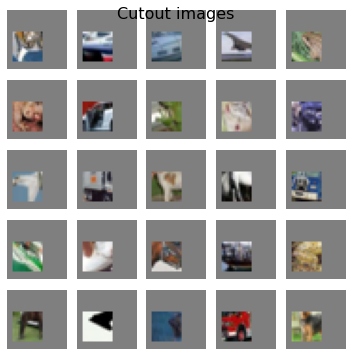

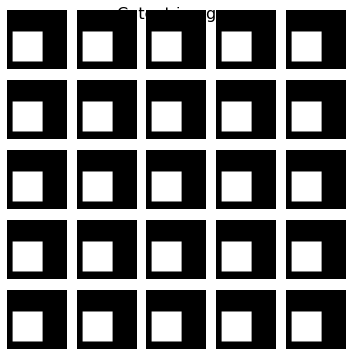

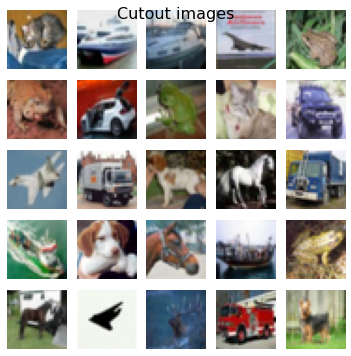

In [7]:
y_batch = y_test[:25]
print(tf.shape(y_batch))
context, block, mask = random_cutout(y_batch, mask_size=(16,16), border=(2,2))

fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(context):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img + 1. ) /2 )
    plt.axis('off')

plt.tight_layout()
plt.savefig('image_at_epoch_0000.png')
plt.show()

fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(block):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img + 1. ) /2 )
    plt.axis('off')

plt.tight_layout()
plt.show()

fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(mask):
    plt.subplot(5,5 ,i+1)
    plt.imshow(img)
    plt.axis('off')

plt.tight_layout()
plt.show()


fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, (b,c) in enumerate(zip(block, context)):
    plt.subplot(5,5 ,i+1)
    plt.imshow((b+c + 1. ) /2 )
    plt.axis('off')

plt.tight_layout()
plt.show()

# Models


## generator

In [8]:
def Generator(input_shape=(32,32,3)):
    inputs = layers.Input(input_shape)
    filters = 64
    bottleneck = 100

    # Encoder
    x = layers.Conv2D(filters, (4,4), strides=(2,2), padding="same")(inputs) 
    x = layers.LeakyReLU(alpha=0.2)(x)

    if input_shape[0] == 128:
      x = layers.Conv2D(filters, (4,4), strides=(2,2), padding="same")(x) 
      x = layers.BatchNormalization()(x)
      x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*2, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*4, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*8, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # BOTTLENECK

    x = layers.Conv2D(bottleneck, (4,4), strides=(2,2), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    
    # Decoder
    x = layers.Conv2DTranspose(filters*8, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters*4, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters*2, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    x = layers.Conv2DTranspose(filters*1, (4,4), strides=(2,2), padding="same")(x) 
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    if input_shape[0] == 128:
      x = layers.Conv2DTranspose(filters*1, (4,4), strides=(2,2), padding="same")(x) 
      x = layers.BatchNormalization()(x)
      x = layers.ReLU()(x)

    outputs = layers.Conv2DTranspose(3, (4,4), strides=(2, 2), padding='same', activation='tanh')(x)

    model = tf.keras.Model(inputs, outputs, name="Generator")

    return model

generator = Generator()
generator.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 16, 16, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         131200    
                                                                 
 batch_normalization (BatchN  (None, 8, 8, 128)        512       
 ormalization)                                                   
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                         

## discriminator

In [9]:
def Discriminator(input_shape=(32,32,3)):
    inputs = layers.Input((input_shape))
    filters = 64
    x = layers.Conv2D(filters, (4,4), strides=2, padding="same", name="conv1")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*2, (4,4), strides=2, padding="same", name="conv2")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*4, (4,4), strides=2, padding="same", name="conv3")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Conv2D(filters*8, (4,4), strides=1, padding="same", name="conv4")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    x = layers.Flatten()(x)
    outputs = layers.Dense(1, activation="sigmoid")(x)

    model = tf.keras.Model(inputs, outputs, name="Discriminator")
    return model

discriminator = Discriminator()
discriminator.summary()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv1 (Conv2D)              (None, 16, 16, 64)        3136      
                                                                 
 batch_normalization_8 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 conv2 (Conv2D)              (None, 8, 8, 128)         131200    
                                                                 
 batch_normalization_9 (Batc  (None, 8, 8, 128)        512       
 hNormalization)                                     

# Context encoder class

In [10]:
class psnr_metric(tf.keras.metrics.Metric):
    def __init__(self, name = 'psnr', **kwargs):
        super(psnr_metric, self).__init__(**kwargs)
        self.value = self.add_weight('value', initializer = 'zeros')
        self.count = self.add_weight('count', initializer = 'zeros')

    def update_state(self, y_true, y_pred,sample_weight=None):
        self.value.assign_add(tf.reduce_mean(tf.image.psnr(y_true, y_pred, 2)))
        self.count.assign_add(1)

    def reset_state(self):
        self.value.assign(0)
        self.count.assign(0)

    def result(self):
        return self.value / self.count

psnr = psnr_metric()

test_batch = y_test[:25]
context, random_region, mask = random_cutout(test_batch, mask_size=(16,16), border=(2,2))
reconstructed = context+generator(context)*mask

psnr(test_batch,reconstructed)



<tf.Tensor: shape=(), dtype=float32, numpy=18.884638>

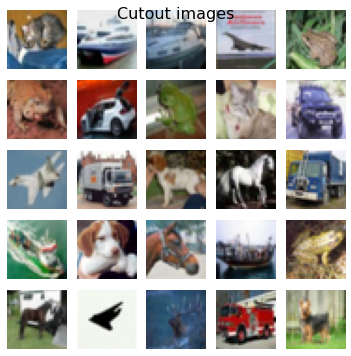

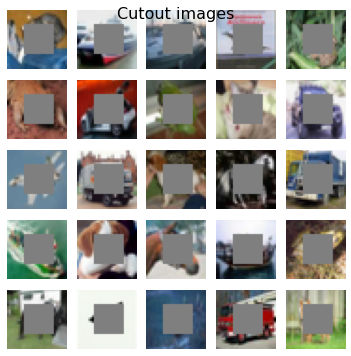

In [11]:
fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(test_batch):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img + 1. ) /2 )
    plt.axis('off')

plt.tight_layout()
plt.show()

fig = plt.figure()
plt.suptitle("Cutout images", fontsize=16)
for i, img in enumerate(reconstructed):
    plt.subplot(5,5 ,i+1)
    plt.imshow((img + 1. ) /2 )
    plt.axis('off')

plt.tight_layout()
plt.show()

In [12]:
class ContextEncoder(tf.keras.Model):
    """Combines the encoder and decoder into an end-to-end model for training."""
    def __init__(self, 
                  discriminator,
                  generator,
                  generator_extra_steps=1,
                  discriminator_extra_steps=1,
                  mask_size=(16,16),
                  border=(2,2),
                  name="context_encoder"):
      super(ContextEncoder, self).__init__()

      self.discriminator = discriminator
      self.generator = generator

      self.d_steps = discriminator_extra_steps
      self.g_steps = generator_extra_steps

      self.psnr_metric = psnr_metric(name="psnr")

      self.mask_size = mask_size
      self.border = border


    def compile(self, generator_optimizer, discriminator_optimizer, generator_loss, discriminator_loss):
      super(ContextEncoder, self).compile()
      self.generator_optimizer = generator_optimizer
      self.generator_loss = generator_loss
      self.discriminator_optimizer=discriminator_optimizer
      self.discriminator_loss = discriminator_loss

    @property
    def metrics(self):
        # We list our `Metric` objects here so that `reset_states()` can be
        # called automatically at the start of each epoch
        # or at the start of `evaluate()`.
        # If you don't implement this property, you have to call
        # `reset_states()` yourself at the time of your choosing.
        # metrics = super().metrics
        # metrics.append(self.psnr_metric)
        return [self.psnr_metric]

    @tf.function
    def test_step(self, data):
      if isinstance(data, tuple):
            x_batch = data[0]
            y_batch = data[1]

      context, random_region, mask = self.random_cutout(x_batch, mask_size=self.mask_size, border=self.border)
      real_images = y_batch

      # Generate fake images from the latent vector
      generated = self.generator(context, training=False)
      fake_images = context + generated * mask
      # Get the logits for the fake images
      fake_logits = self.discriminator(fake_images, training=False)
      # Get the logits for the real images
      real_logits = self.discriminator(real_images, training=False)

      # Calculate loss
      d_loss = self.discriminator_loss(real_logits, fake_logits)
      g_loss = self.generator_loss(fake_logits, real_images, fake_images)

      self.psnr_metric.update_state(real_images,fake_images)
      return {"g_loss": g_loss,"d_loss": d_loss, "psnr": self.psnr_metric.result()}


    @tf.function
    def train_step(self, data):
      if isinstance(data, tuple):
            x_batch = data[0]
            y_batch = data[1]

      context, random_region, mask = self.random_cutout(x_batch, mask_size=self.mask_size, border=self.border)
      real_images = y_batch

      for i in range(self.d_steps):
        with tf.GradientTape() as tape:
          # Generate fake images from the latent vector
          generated = self.generator(context, training=False)
          fake_images = context + generated * mask
          # Get the logits for the fake images
          fake_logits = self.discriminator(fake_images, training=True)
          # Get the logits for the real images
          real_logits = self.discriminator(real_images, training=True)

          # Calculate loss
          d_loss = self.discriminator_loss(real_logits, fake_logits)

        # Get the gradients w.r.t the discriminator loss
        d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update the weights of the discriminator using the discriminator optimizer
        self.discriminator_optimizer.apply_gradients(zip(d_gradient, self.discriminator.trainable_variables))

      for i in range(self.g_steps):
        with tf.GradientTape() as tape:
          # Generate fake images using the generator
          generated = self.generator(context, training=False)
          generated_images = context + generated * mask
          # Get the discriminator logits for fake images
          gen_img_logits = self.discriminator(generated_images, training=True)
          # Calculate the generator loss
          g_loss = self.generator_loss(gen_img_logits, real_images, generated_images)

        # Get the gradients w.r.t the generator loss
        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update the weights of the generator using the generator optimizer
        self.generator_optimizer.apply_gradients(zip(gen_gradient, self.generator.trainable_variables))

      # Compute our own metrics
      self.psnr_metric.update_state(real_images,fake_images)
      return {"g_loss": g_loss,"d_loss": d_loss, "psnr": self.psnr_metric.result()}

      # def adv_loss(fake_preds):
      #   return cross_entropy(tf.ones_like(fake_preds), fake_preds)

      # def rec_loss(y_true, y_pred):
      #   batch_size = len(y_true)
      #   return tf.sqrt(tf.nn.l2_loss(y_true - y_pred)) / batch_size

    def random_cutout(self, image_batch, mask_size, border):
      x = tf.shape(image_batch)[1]
      y = tf.shape(image_batch)[2]

      xoffset = tf.cast(tf.math.ceil(mask_size[0] / 2.) + border[0], dtype=tf.int32)
      yoffset = tf.cast(tf.math.ceil(mask_size[1] / 2.) + border[1], dtype=tf.int32)
      xmin, xmax = xoffset, x - xoffset
      ymin, ymax = yoffset, y - yoffset

      if xmin < xmax:
        xoffset = tf.random.uniform(shape=[], minval=xmin, maxval=xmax, dtype=tf.dtypes.int32)
      else:
        xoffset = tf.cast(x / 2, dtype=tf.int32)
      if ymin < ymax:
        yoffset = tf.random.uniform(shape=[], minval=ymin, maxval=ymax, dtype=tf.dtypes.int32)
      else:
        yoffset = tf.cast(y / 2, dtype=tf.int32)

      xmin, xmax = xoffset - tf.cast(tf.math.ceil(mask_size[0] / 2.), dtype=tf.int32), xoffset + tf.cast(tf.math.ceil(mask_size[0] / 2.), dtype=tf.int32)
      ymin, ymax = yoffset - tf.cast(tf.math.ceil(mask_size[1] / 2.), dtype=tf.int32), yoffset + tf.cast(tf.math.ceil(mask_size[1] / 2.), dtype=tf.int32)

      mask = tfa.image.cutout(tf.zeros_like(image_batch), mask_size=mask_size, offset=(yoffset,xoffset), constant_values=1.)
      context = image_batch * (1 - mask)
      random_region = image_batch * mask
      return context, random_region, mask

# Compile

## loss

In [13]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

In [14]:
def discriminator_loss(real_preds, fake_preds):
  real_loss = cross_entropy(tf.ones_like(real_preds), real_preds)
  fake_loss = cross_entropy(tf.zeros_like(fake_preds), fake_preds)
  total_loss = real_loss + fake_loss
  return total_loss

discriminator_loss(discriminator(y_test[0:128], training=False), discriminator(generator(x_test[0:128]), training=False))

<tf.Tensor: shape=(), dtype=float32, numpy=1.381082>

In [15]:
def adv_loss(fake_preds):
  return cross_entropy(tf.ones_like(fake_preds), fake_preds)

def rec_loss(y_true, y_pred):
  return tf.reduce_mean((y_true - y_pred)**2)       # MSE / L2
  # return tf.reduce_mean(tf.abs(y_true - y_pred))  # MAE / L1

rec_loss(tf.ones((128,32,32,3)),-tf.ones((128,32,32,3)))

<tf.Tensor: shape=(), dtype=float32, numpy=4.0>

In [16]:
LAM_REC = 0.99
LAM_ADV = 0.01
def generator_loss(fake_logits, real_images, fake_images):
    return LAM_REC * rec_loss(real_images, fake_images) + LAM_ADV * adv_loss(fake_logits)

generator_loss(discriminator(generator(x_test[0:128]), training=False),y_test[0:128], generator(x_test[0:128]))

<tf.Tensor: shape=(), dtype=float32, numpy=0.27006564>

## metrics

## optimizers

In [17]:
# Instantiate the optimizer for both networks
# (learning_rate=0.0002, beta_1=0.5 are recommended)

LR = 0.0002
BETA1 = 0.5
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=LR*10, beta_1=BETA1)            # 3e-4
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=LR, beta_1=BETA1)       # 3e-5

## model compile

In [18]:
MASK_SIZE = (16,16)
BORDER = (2,2)
ctxtenc = ContextEncoder(discriminator=Discriminator(), 
                         generator= Generator(),
                         mask_size=MASK_SIZE,
                         border=BORDER)

ctxtenc.compile(generator_loss = generator_loss, 
             discriminator_loss=discriminator_loss,
             generator_optimizer=generator_optimizer,
             discriminator_optimizer=discriminator_optimizer,)

# Training

In [19]:
images_to_show = x_test[:25]
print(images_to_show.shape)

(25, 32, 32, 3)


In [20]:
class GANMonitor(tf.keras.callbacks.Callback):
    def __init__(self, images_to_show=None, save_every=1):
        self.images_to_show = images_to_show
        self.save_every = save_every
        print(self.images_to_show.shape)

    def on_epoch_end(self, epoch, logs=None):
      if (epoch + 1) % self.save_every == 0:

        context, random_region, mask = self.model.random_cutout(self.images_to_show, 
                                                                mask_size=(16,16), 
                                                                border=(8,8))
        generated = self.model.generator(context, training=False)

        reconstructed_images = context + generated * mask
        plt.ioff()

        fig = plt.figure()
        plt.suptitle(f"epoch:{epoch+1}")
        for i in range(reconstructed_images.shape[0]):
            plt.subplot(5,5, i+1)
            plt.imshow((reconstructed_images[i] + 1. ) /2 )
            plt.axis('off')
        plt.tight_layout()
        plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+1))
        plt.close(fig)

show_images = GANMonitor(images_to_show=images_to_show, save_every=1)


(25, 32, 32, 3)


In [21]:
EPOCHS = 100
BATCH_SIZE = 64
history = ctxtenc.fit(x=x_train,
                      y=y_train,
                      validation_data=(x_test, y_test),
                      epochs=EPOCHS, 
                      initial_epoch = 0,
                      batch_size = BATCH_SIZE,
                      shuffle=True, 
                      callbacks=[show_images])

Epoch 1/100
782/782 [==============================] - 62s 72ms/step - g_loss: 0.0776 - d_loss: 1.3302 - psnr: 18.6021 - val_g_loss: 0.1235 - val_d_loss: 1.7008 - val_psnr: 17.9190
Epoch 2/100
782/782 [==============================] - 54s 70ms/step - g_loss: 0.0658 - d_loss: 1.2565 - psnr: 19.2056 - val_g_loss: 0.0747 - val_d_loss: 1.5582 - val_psnr: 18.8851
Epoch 3/100
782/782 [==============================] - 54s 69ms/step - g_loss: 0.0613 - d_loss: 1.2737 - psnr: 19.5204 - val_g_loss: 0.0873 - val_d_loss: 1.5616 - val_psnr: 19.7388
Epoch 4/100
782/782 [==============================] - 54s 69ms/step - g_loss: 0.0592 - d_loss: 1.2480 - psnr: 19.7624 - val_g_loss: 0.0692 - val_d_loss: 1.7627 - val_psnr: 19.7214
Epoch 5/100
782/782 [==============================] - 54s 69ms/step - g_loss: 0.0594 - d_loss: 1.2164 - psnr: 19.8562 - val_g_loss: 0.0834 - val_d_loss: 2.1509 - val_psnr: 19.6205
Epoch 6/100
782/782 [==============================] - 54s 69ms/step - g_loss: 0.0715 - d_loss:

# Visualization

## plots

In [23]:
## Plot train and validation curves
g_loss = history.history['g_loss']
val_g_loss =  history.history['val_g_loss']

d_loss =  history.history['d_loss']
val_d_loss =  history.history['val_d_loss']

psnr =  history.history['psnr']
val_psnr =  history.history['val_psnr']

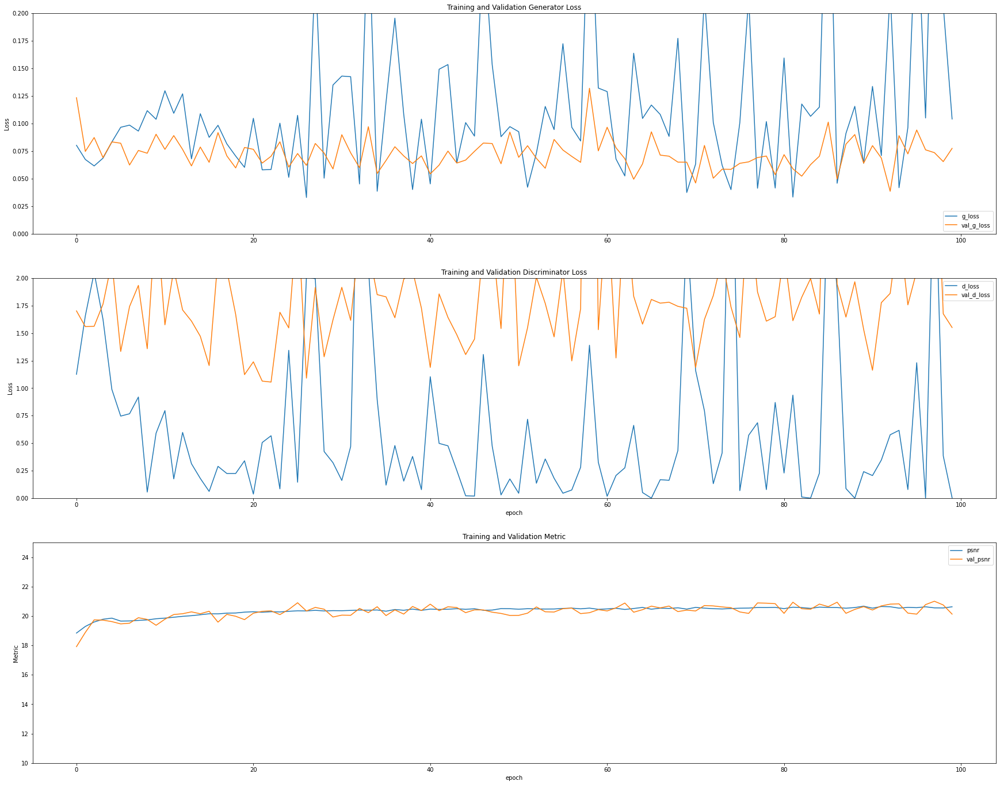

In [24]:
plt.figure(figsize=(30, 24))
plt.subplot(3, 1, 1)
plt.plot(g_loss, label='g_loss')
plt.plot(val_g_loss, label='val_g_loss')
plt.legend(loc='lower right')
plt.ylabel('Loss')
plt.ylim([0,.2])
plt.title('Training and Validation Generator Loss')

plt.subplot(3, 1, 2)
plt.plot(d_loss, label='d_loss')
plt.plot(val_d_loss, label='val_d_loss')
plt.legend(loc='upper right')
plt.ylabel('Loss')
plt.ylim([0,2])
plt.title('Training and Validation Discriminator Loss')
plt.xlabel('epoch')



plt.subplot(3, 1, 3)
plt.plot(psnr, label='psnr')
plt.plot(val_psnr, label='val_psnr')
plt.legend(loc='upper right')
plt.ylabel('Metric')
plt.ylim([10,25])
plt.title('Training and Validation Metric')
plt.xlabel('epoch')

# plt.savefig(OUTPUT_FILEPATH / f'training_history.png',
#              facecolor='white',
#             bbox_inches='tight')
plt.show()

## last epoch output

In [25]:
history.epoch[-1]

99

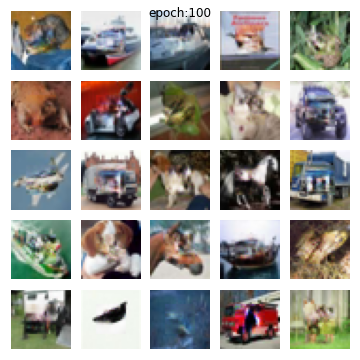

In [26]:
# Display a single image using the epoch number
def display_image(epoch_no):
  return PIL.Image.open('image_at_epoch_{:04d}.png'.format(epoch_no))
display_image(history.epoch[-1]+1)

## gif

In [27]:
anim_file = 'dcgan.gif'

filenames = glob.glob('image*.png')
filenames = sorted(filenames)
frames = []
for i,filename in enumerate(filenames):
  if i % 1 == 0:
    image = imageio.imread(filename)
    frames.append(image)
imageio.mimsave(anim_file, frames, format='GIF', fps=4)



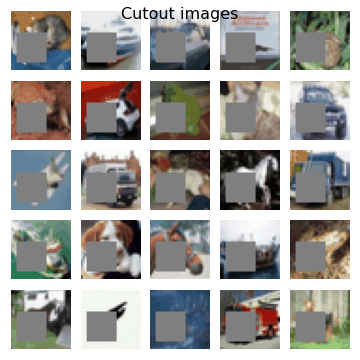

In [28]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)
